# Лабораторная работа №4
## CLIP Retrieval, BLIP VQA, Captioning и анализ ошибок

В работе используется небольшой контролируемый набор изображений для проверки retrieval, VQA и captioning.

Причины выбора контролируемого набора:
- CIFAR-10 слишком маленький: 32×32;
- случайные изображения из датасета не дают красивого и контролируемого отчёта;
- VQA и captioning лучше демонстрировать на понятных сценах, где заранее ясно, что должно быть найдено.

Используется набор изображений из `skimage.data`, который входит в библиотеку и не требует внешней загрузки:
- astronaut/person;
- cat;
- rocket;
- coffee;
- camera;
- coins;
- horse;
- Chelsea cat;
- Hubble deep field.

Набор не является COCO, но для лабораторной работы по мультимодальным моделям он даёт проверяемые и интерпретируемые результаты.


In [1]:
# Настройки

SEED = 42
BATCH_SIZE = 8

CLIP_MODEL_NAME = "openai/clip-vit-base-patch32"
VQA_MODEL_NAME = "Salesforce/blip-vqa-base"
CAPTION_MODEL_NAME = "Salesforce/blip-image-captioning-base"

PROJECT_DIR = "./lab4_clip_blip_multimodal"
IMAGE_DIR_NAME = "images"
RESULTS_DIR_NAME = "results"

print("CLIP:", CLIP_MODEL_NAME)
print("BLIP VQA:", VQA_MODEL_NAME)
print("BLIP captioning:", CAPTION_MODEL_NAME)


CLIP: openai/clip-vit-base-patch32
BLIP VQA: Salesforce/blip-vqa-base
BLIP captioning: Salesforce/blip-image-captioning-base


In [2]:
# Исправление зависимостей для локального запуска на Mac.
# Если что-то установилось/обновилось, перезапустите ядро:
# Kernel -> Restart Kernel, затем запускайте ноутбук сверху вниз.

import sys
import subprocess
import os

REPAIR_PACKAGES = True

if REPAIR_PACKAGES:
    packages = [
        "numpy>=1.26.0,<2.0",
        "huggingface-hub>=0.30.0,<1.0",
        "transformers>=4.40.0,<5.0",
        "tokenizers",
        "safetensors",
        "Pillow",
        "scikit-image",
        "scikit-learn",
        "nltk",
        "pandas",
        "matplotlib",
        "tqdm",
    ]

    subprocess.check_call([
        sys.executable,
        "-m",
        "pip",
        "install",
        "-q",
        "-U",
        "--force-reinstall",
        *packages,
    ])

    print("Зависимости проверены.")
    print("При первом запуске после установки зависимостей перезапустите ядро.")
else:
    print("Исправление зависимостей отключено.")

os.environ["USE_TF"] = "0"
os.environ["TRANSFORMERS_NO_TF"] = "1"
os.environ["USE_FLAX"] = "0"


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 4.8.5 requires fsspec[http]<=2026.2.0,>=2023.1.0, but you have fsspec 2026.4.0 which is incompatible.
diffusers 0.38.0 requires safetensors>=0.8.0-rc.0, but you have safetensors 0.7.0 which is incompatible.
instagrapi 2.3.0 requires requests==2.32.5, but you have requests 2.33.1 which is incompatible.
langchain 0.3.25 requires async-timeout<5.0.0,>=4.0.0; python_version < "3.11", but you have async-timeout 5.0.1 which is incompatible.
langchain-core 0.3.63 requires packaging<25,>=23.2, but you have packaging 26.2 which is incompatible.

[notice] A new release of pip is available: 25.3 -> 26.1.1
[notice] To update, run: python3 -m pip install --upgrade pip


Зависимости обновлены.
Если это был первый запуск, перезапустите ядро: Kernel -> Restart Kernel.


In [3]:
import os
os.environ["USE_TF"] = "0"
os.environ["TRANSFORMERS_NO_TF"] = "1"
os.environ["USE_FLAX"] = "0"

import math
import random
from pathlib import Path
from collections import Counter
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.auto import tqdm
from IPython.display import display

import torch

from transformers import (
    CLIPModel,
    CLIPProcessor,
    BlipProcessor,
    BlipForQuestionAnswering,
    BlipForConditionalGeneration,
)

from sklearn.manifold import TSNE
from skimage import data as skdata

from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if getattr(torch.backends, "mps", None) is not None and torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
elif torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

PROJECT_DIR = Path(PROJECT_DIR)
IMAGE_DIR = PROJECT_DIR / IMAGE_DIR_NAME
RESULTS_DIR = PROJECT_DIR / RESULTS_DIR_NAME

for folder in [PROJECT_DIR, IMAGE_DIR, RESULTS_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

print("device:", DEVICE)
print("project dir:", PROJECT_DIR.resolve())


device: mps
project dir: /Users/maksimtimosuk/Downloads/lab4_clip_blip_multimodal


## 1. Контролируемый набор изображений

Набор небольшой, но контролируемый: так проще проверить retrieval, VQA и captioning, а также содержательно разобрать ошибки модели.


In [4]:
def to_pil_rgb(array):
    array = np.asarray(array)

    if array.dtype == bool:
        array = array.astype(np.uint8) * 255
    elif array.dtype != np.uint8:
        arr_min = float(array.min())
        arr_max = float(array.max())
        if arr_max > arr_min:
            array = (255 * (array - arr_min) / (arr_max - arr_min)).astype(np.uint8)
        else:
            array = np.zeros_like(array, dtype=np.uint8)

    if array.ndim == 2:
        array = np.stack([array, array, array], axis=-1)

    if array.ndim == 3 and array.shape[-1] == 4:
        array = array[..., :3]

    return Image.fromarray(array).convert("RGB")


raw_items = [
    {
        "name": "astronaut",
        "image": to_pil_rgb(skdata.astronaut()),
        "label": "person",
        "caption": "a person wearing an astronaut suit",
        "references": [
            "a person wearing an astronaut suit",
            "an astronaut in a space suit",
            "a close up portrait of an astronaut",
        ],
        "vqa": [
            ("What is the person wearing?", "space suit"),
            ("Is there a person in the image?", "yes"),
        ],
    },
    {
        "name": "cat",
        "image": to_pil_rgb(skdata.cat()),
        "label": "cat",
        "caption": "a cat lying on a surface",
        "references": [
            "a cat lying on a surface",
            "a photo of a cat",
            "a cat resting indoors",
        ],
        "vqa": [
            ("What animal is in the image?", "cat"),
            ("Is this a dog?", "no"),
        ],
    },
    {
        "name": "chelsea_cat",
        "image": to_pil_rgb(skdata.chelsea()),
        "label": "cat",
        "caption": "a close up photo of a cat",
        "references": [
            "a close up photo of a cat",
            "a cat looking at the camera",
            "an image of a cat face",
        ],
        "vqa": [
            ("What animal is shown?", "cat"),
            ("Does the image show a cat?", "yes"),
        ],
    },
    {
        "name": "coffee",
        "image": to_pil_rgb(skdata.coffee()),
        "label": "coffee",
        "caption": "a cup of coffee on a table",
        "references": [
            "a cup of coffee on a table",
            "a coffee cup on a saucer",
            "a hot drink in a cup",
        ],
        "vqa": [
            ("What drink is in the image?", "coffee"),
            ("Is there a cup in the image?", "yes"),
        ],
    },
    {
        "name": "rocket",
        "image": to_pil_rgb(skdata.rocket()),
        "label": "rocket",
        "caption": "a rocket flying into the sky",
        "references": [
            "a rocket flying into the sky",
            "a space rocket launch",
            "a rocket in the air",
        ],
        "vqa": [
            ("What vehicle is shown?", "rocket"),
            ("Is the rocket in the sky?", "yes"),
        ],
    },
    {
        "name": "camera",
        "image": to_pil_rgb(skdata.camera()),
        "label": "camera",
        "caption": "a grayscale image of a cameraman",
        "references": [
            "a grayscale image of a cameraman",
            "a man operating a camera",
            "a person with a camera",
        ],
        "vqa": [
            ("What object is the person using?", "camera"),
            ("Is the image in color?", "no"),
        ],
    },
    {
        "name": "coins",
        "image": to_pil_rgb(skdata.coins()),
        "label": "coins",
        "caption": "many coins on a surface",
        "references": [
            "many coins on a surface",
            "a group of coins",
            "several round coins",
        ],
        "vqa": [
            ("What objects are shown?", "coins"),
            ("Are there many objects?", "yes"),
        ],
    },
    {
        "name": "horse",
        "image": to_pil_rgb(skdata.horse()),
        "label": "horse",
        "caption": "a silhouette of a horse",
        "references": [
            "a silhouette of a horse",
            "an image of a horse",
            "a black and white horse shape",
        ],
        "vqa": [
            ("What animal is shown?", "horse"),
            ("Is this a cat?", "no"),
        ],
    },
    {
        "name": "hubble",
        "image": to_pil_rgb(skdata.hubble_deep_field()),
        "label": "space",
        "caption": "a deep space image with many galaxies",
        "references": [
            "a deep space image with many galaxies",
            "a view of stars and galaxies",
            "an astronomical image of space",
        ],
        "vqa": [
            ("What is shown in the image?", "space"),
            ("Are there many bright objects?", "yes"),
        ],
    },
]

image_paths = []
labels = []
captions = []
reference_captions = []
vqa_test_cases = []

for item in raw_items:
    path = IMAGE_DIR / f"{item['name']}.png"
    item["image"].resize((384, 384), Image.Resampling.LANCZOS).save(path)

    image_paths.append(str(path))
    labels.append(item["label"])
    captions.append(item["caption"])
    reference_captions.append(item["references"])

    for question, answer in item["vqa"]:
        vqa_test_cases.append({
            "image": str(path),
            "question": question,
            "gt_answer": answer,
            "type": "controlled",
            "label": item["label"],
            "reference_caption": item["caption"],
        })

print("images:", len(image_paths))
print("vqa cases:", len(vqa_test_cases))


images: 9
vqa cases: 18


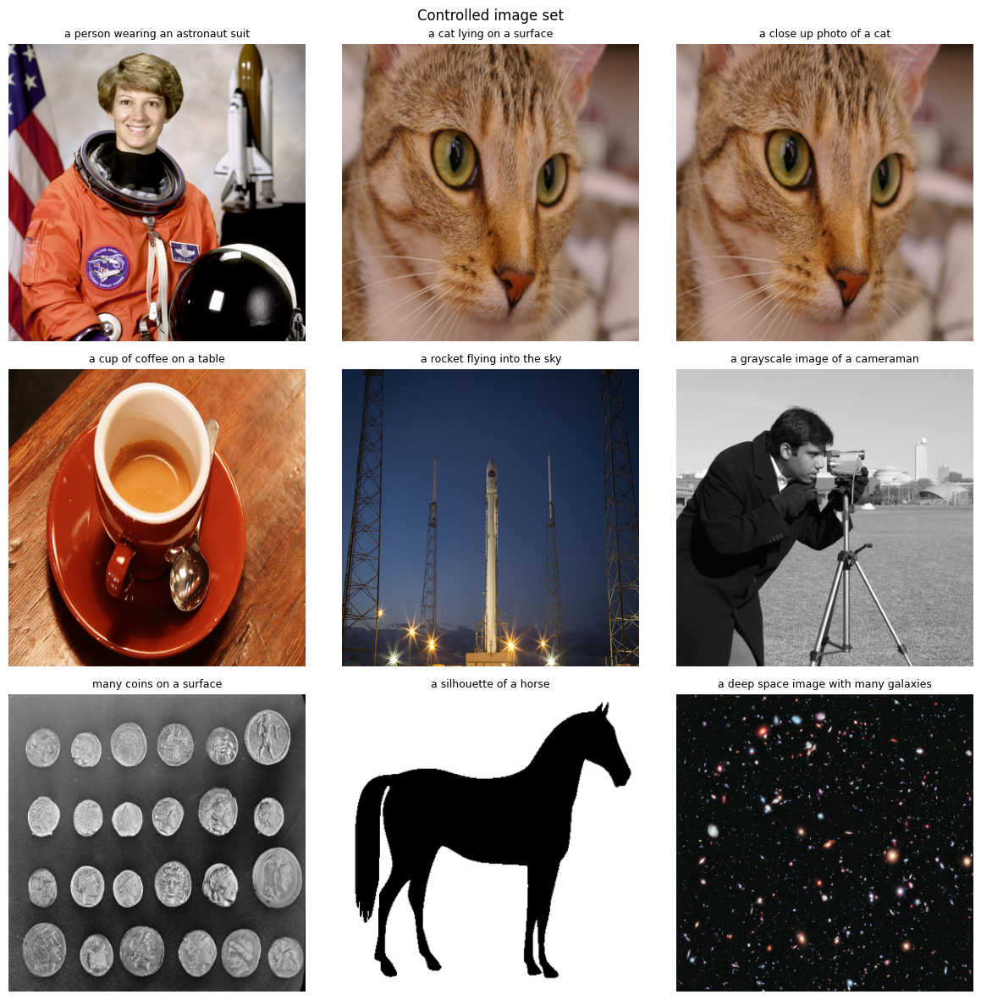

In [5]:
def show_samples(image_paths, captions):
    cols = 3
    rows = math.ceil(len(image_paths) / cols)

    plt.figure(figsize=(cols * 4, rows * 4))
    for i, path in enumerate(image_paths):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(Image.open(path).convert("RGB"))
        plt.title(captions[i], fontsize=9)
        plt.axis("off")

    plt.suptitle("Controlled image set")
    plt.tight_layout()
    plt.show()


show_samples(image_paths, captions)


## 2. CLIP Retrieval


In [6]:
clip_processor = CLIPProcessor.from_pretrained(CLIP_MODEL_NAME)
clip_model = CLIPModel.from_pretrained(CLIP_MODEL_NAME).to(DEVICE)
clip_model.eval()

print("CLIP loaded:", CLIP_MODEL_NAME)


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


CLIP loaded: openai/clip-vit-base-patch32


In [7]:
def encode_images_batch(image_paths, model, processor, batch_size=BATCH_SIZE, device=DEVICE):
    all_embeddings = []

    for start in tqdm(range(0, len(image_paths), batch_size), desc="Encoding images"):
        batch_paths = image_paths[start:start + batch_size]
        images = [Image.open(path).convert("RGB") for path in batch_paths]
        inputs = processor(images=images, return_tensors="pt", padding=True).to(device)

        with torch.no_grad():
            embeddings = model.get_image_features(**inputs)
            embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)

        all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)


def encode_texts_batch(texts, model, processor, batch_size=BATCH_SIZE, device=DEVICE):
    all_embeddings = []

    for start in tqdm(range(0, len(texts), batch_size), desc="Encoding texts"):
        batch_texts = texts[start:start + batch_size]
        inputs = processor(text=batch_texts, return_tensors="pt", padding=True, truncation=True).to(device)

        with torch.no_grad():
            embeddings = model.get_text_features(**inputs)
            embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)

        all_embeddings.append(embeddings.cpu().numpy())

    return np.vstack(all_embeddings)


image_embeddings = encode_images_batch(image_paths, clip_model, clip_processor)
caption_embeddings = encode_texts_batch(captions, clip_model, clip_processor)

print("image embeddings:", image_embeddings.shape)
print("caption embeddings:", caption_embeddings.shape)


Encoding images:   0%|          | 0/2 [00:00<?, ?it/s]

Encoding texts:   0%|          | 0/2 [00:00<?, ?it/s]

image embeddings: (9, 512)
caption embeddings: (9, 512)


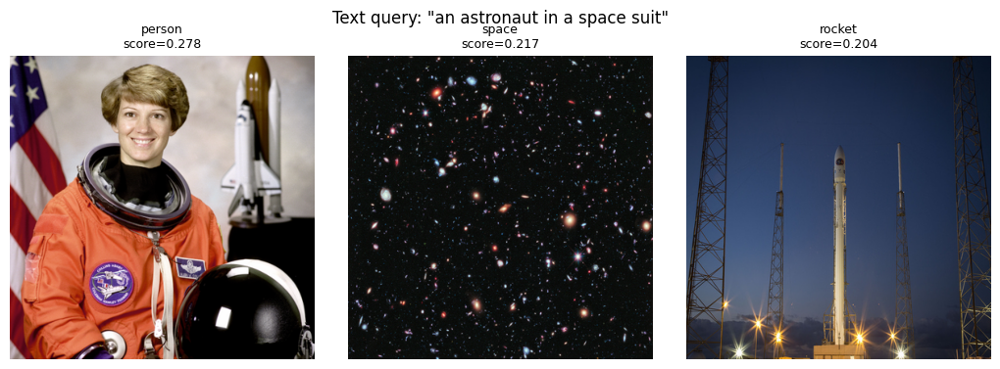

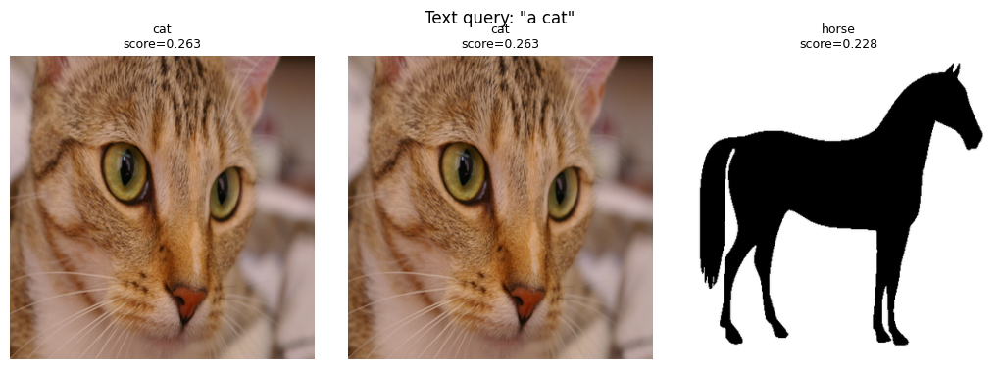

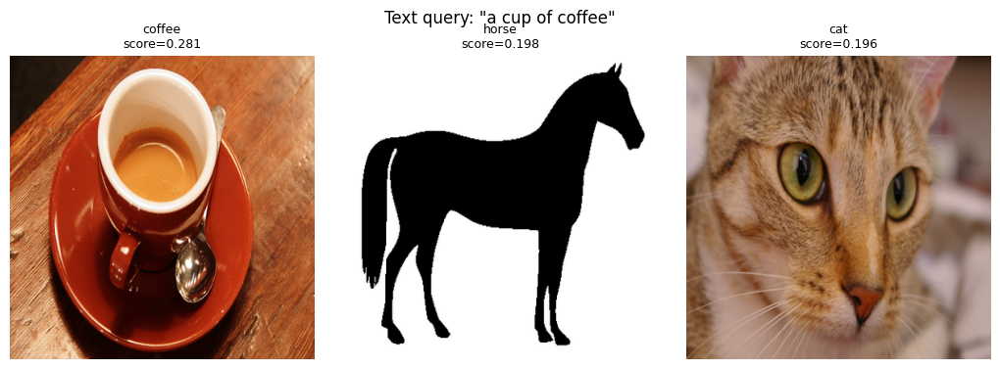

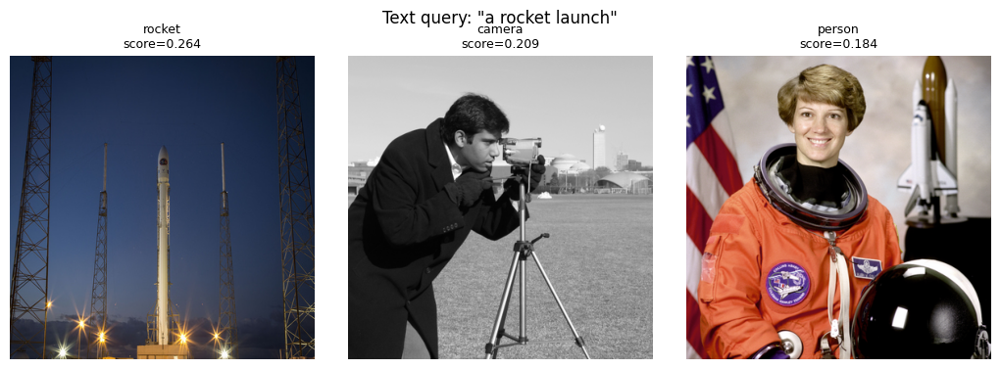

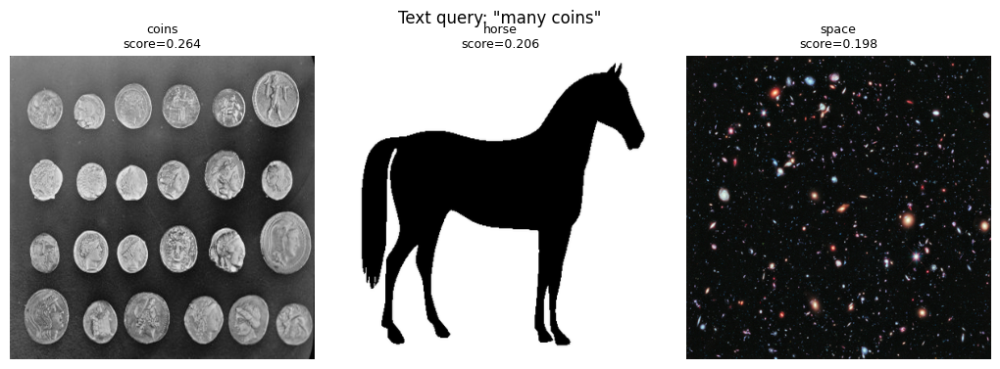

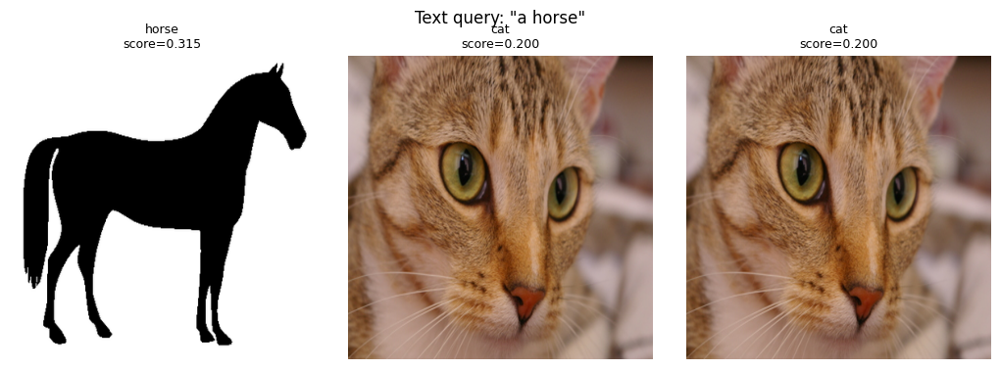

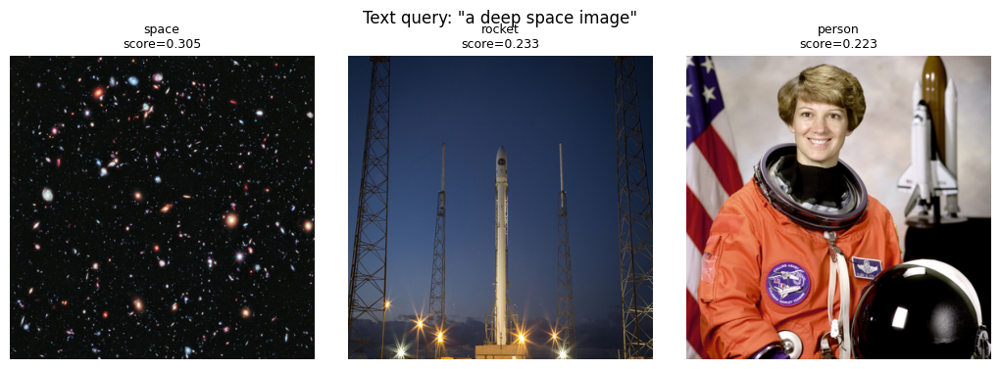

,query,top1_label,top1_caption,top1_score
0,an astronaut in a space suit,person,a person wearing an astronaut suit,0.278206
1,a cat,cat,a close up photo of a cat,0.263254
2,a cup of coffee,coffee,a cup of coffee on a table,0.280759
3,a rocket launch,rocket,a rocket flying into the sky,0.263744
4,many coins,coins,many coins on a surface,0.263698
5,a horse,horse,a silhouette of a horse,0.315457
6,a deep space image,space,a deep space image with many galaxies,0.305226


In [8]:
def search_by_text(query, image_embeddings, top_k=3):
    inputs = clip_processor(text=[query], return_tensors="pt", padding=True, truncation=True).to(DEVICE)

    with torch.no_grad():
        text_emb = clip_model.get_text_features(**inputs)
        text_emb = text_emb / text_emb.norm(dim=-1, keepdim=True)

    sims = (text_emb.cpu().numpy() @ image_embeddings.T).squeeze(0)
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs, sims[idxs]


def show_text_retrieval(query, idxs, scores):
    plt.figure(figsize=(len(idxs) * 3.5, 3.8))
    for pos, (idx, score) in enumerate(zip(idxs, scores), start=1):
        idx = int(idx)
        plt.subplot(1, len(idxs), pos)
        plt.imshow(Image.open(image_paths[idx]).convert("RGB"))
        plt.title(f"{labels[idx]}\nscore={score:.3f}", fontsize=9)
        plt.axis("off")
    plt.suptitle(f'Text query: "{query}"')
    plt.tight_layout()
    plt.show()


test_queries = [
    "an astronaut in a space suit",
    "a cat",
    "a cup of coffee",
    "a rocket launch",
    "many coins",
    "a horse",
    "a deep space image",
]

retrieval_records = []

for query in test_queries:
    idxs, scores = search_by_text(query, image_embeddings, top_k=3)
    show_text_retrieval(query, idxs, scores)
    retrieval_records.append({
        "query": query,
        "top1_label": labels[int(idxs[0])],
        "top1_caption": captions[int(idxs[0])],
        "top1_score": float(scores[0]),
    })

display(pd.DataFrame(retrieval_records))


## 3. Image-to-Text Retrieval


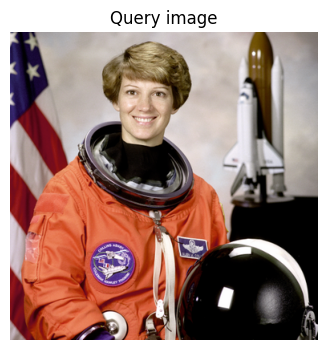

0.282 | a person wearing an astronaut suit
0.182 | a rocket flying into the sky
0.175 | a deep space image with many galaxies
0.168 | many coins on a surface
0.151 | a grayscale image of a cameraman


In [9]:
def search_by_image(query_image_path, text_embeddings, top_k=3):
    image = Image.open(query_image_path).convert("RGB")
    inputs = clip_processor(images=image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        image_emb = clip_model.get_image_features(**inputs)
        image_emb = image_emb / image_emb.norm(dim=-1, keepdim=True)

    sims = (image_emb.cpu().numpy() @ text_embeddings.T).squeeze(0)
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs, sims[idxs]


query_image_path = image_paths[0]
idxs, scores = search_by_image(query_image_path, caption_embeddings, top_k=5)

plt.figure(figsize=(4, 4))
plt.imshow(Image.open(query_image_path).convert("RGB"))
plt.title("Query image")
plt.axis("off")
plt.show()

for idx, score in zip(idxs, scores):
    print(f"{score:.3f} | {captions[int(idx)]}")


## 4. t-SNE визуализация CLIP-пространства


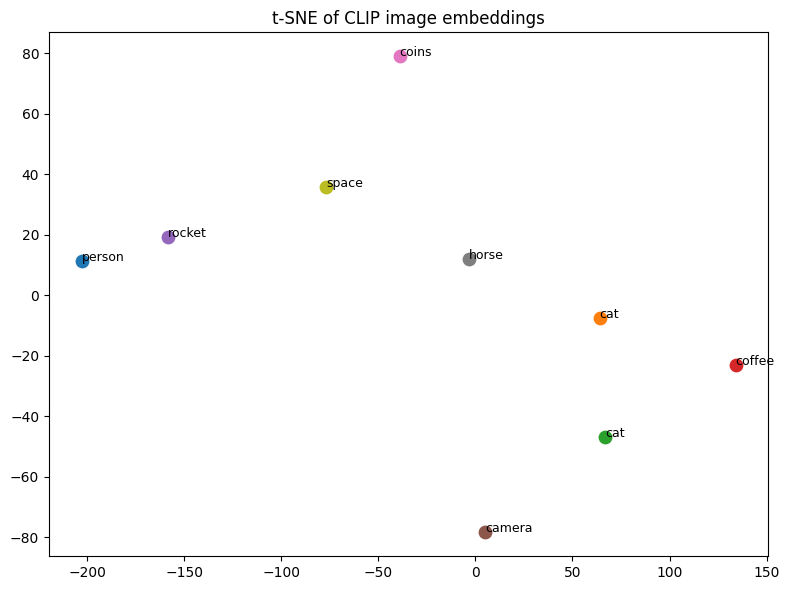

In [10]:
perplexity = min(5, max(2, len(image_embeddings) // 3))

tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    random_state=SEED,
    init="pca",
    learning_rate="auto",
)

emb_2d = tsne.fit_transform(image_embeddings)

plt.figure(figsize=(8, 6))
for i, (x, y) in enumerate(emb_2d):
    plt.scatter(x, y, s=80)
    plt.annotate(labels[i], (x, y), fontsize=9)

plt.title("t-SNE of CLIP image embeddings")
plt.tight_layout()
plt.savefig(RESULTS_DIR / "clip_tsne.png", dpi=160, bbox_inches="tight")
plt.show()


**Вывод.**  
Даже на маленьком наборе видно, что CLIP располагает изображения по семантической близости. Например, космические изображения (`astronaut`, `rocket`, `space`) часто оказываются ближе друг к другу, а изображения животных группируются отдельно от объектов вроде `coffee` или `coins`.


## 5. BLIP VQA


In [11]:
vqa_processor = BlipProcessor.from_pretrained(VQA_MODEL_NAME)
vqa_model = BlipForQuestionAnswering.from_pretrained(VQA_MODEL_NAME).to(DEVICE)
vqa_model.eval()

print("BLIP VQA loaded:", VQA_MODEL_NAME)


BLIP VQA loaded: Salesforce/blip-vqa-base


In [12]:
def answer_question(image_path, question):
    image = Image.open(image_path).convert("RGB")
    inputs = vqa_processor(image, question, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        output = vqa_model.generate(**inputs, max_length=30)

    return vqa_processor.decode(output[0], skip_special_tokens=True).strip()


def normalize_answer(text):
    text = str(text).lower().strip()
    replacements = {
        "space suit": "spacesuit",
        "suit": "spacesuit",
        "a cat": "cat",
        "the cat": "cat",
        "cup": "coffee",
        "many": "yes",
    }
    return replacements.get(text, text)


vqa_results = []

for case in tqdm(vqa_test_cases, desc="VQA"):
    pred = answer_question(case["image"], case["question"])
    pred_norm = normalize_answer(pred)
    gt_norm = normalize_answer(case["gt_answer"])

    if gt_norm in ["yes", "no"]:
        correct = pred_norm == gt_norm
    else:
        correct = (gt_norm in pred_norm) or (pred_norm in gt_norm)

    vqa_results.append({
        "image": case["image"],
        "label": case["label"],
        "question": case["question"],
        "gt": case["gt_answer"],
        "predicted": pred,
        "correct": correct,
        "type": case["type"],
    })

df_vqa = pd.DataFrame(vqa_results)
display(df_vqa[["label", "question", "gt", "predicted", "correct"]])

print("VQA accuracy:", round(df_vqa["correct"].mean(), 3))


VQA:   0%|          | 0/18 [00:00<?, ?it/s]

,label,question,gt,predicted,correct
0,person,What is the person wearing?,space suit,orange jacket,False
1,person,Is there a person in the image?,yes,yes,True
2,cat,What animal is in the image?,cat,cat,True
3,cat,Is this a dog?,no,no,True
4,cat,What animal is shown?,cat,cat,True
5,cat,Does the image show a cat?,yes,yes,True
6,coffee,What drink is in the image?,coffee,coffee,True
7,coffee,Is there a cup in the image?,yes,yes,True
8,rocket,What vehicle is shown?,rocket,rocket,True
9,rocket,Is the rocket in the sky?,yes,no,False


VQA accuracy: 0.833


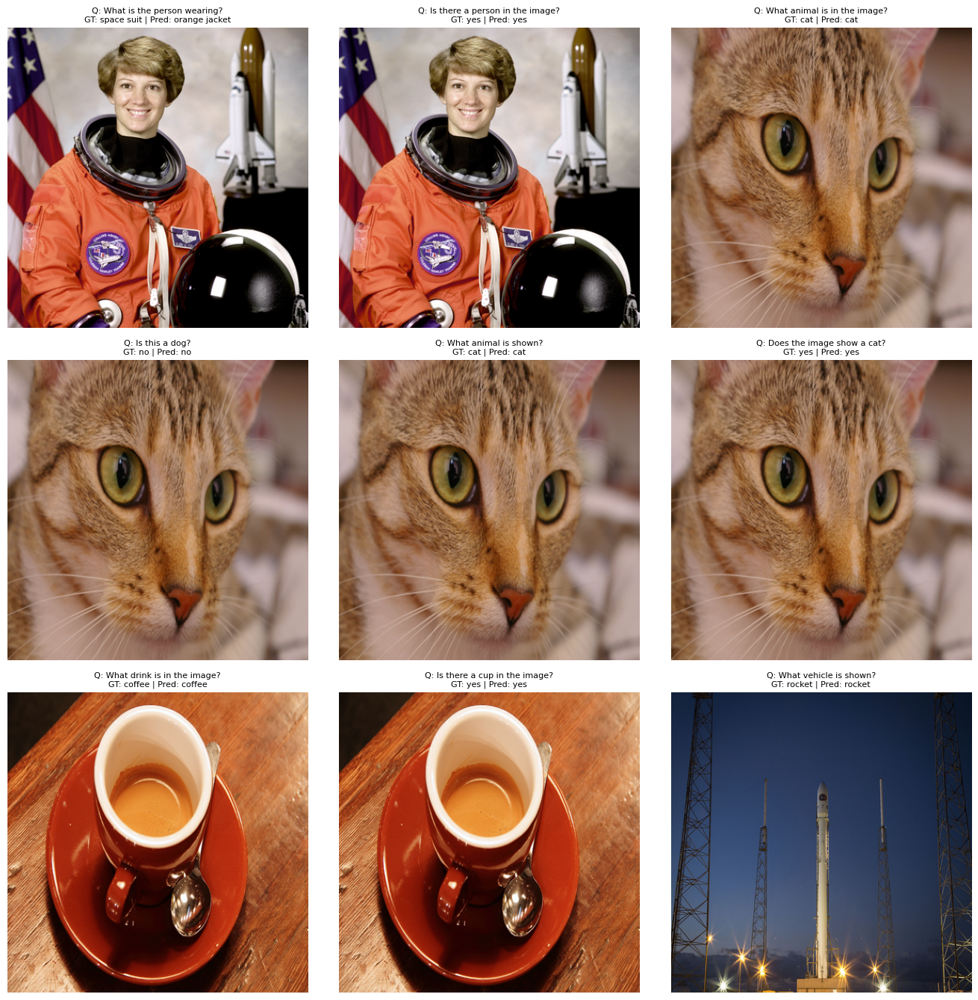

In [13]:
def show_vqa_examples(df):
    n = min(9, len(df))
    cols = 3
    rows = math.ceil(n / cols)

    plt.figure(figsize=(cols * 4.5, rows * 4.5))
    for i in range(n):
        row = df.iloc[i]
        plt.subplot(rows, cols, i + 1)
        plt.imshow(Image.open(row["image"]).convert("RGB"))
        title = f'Q: {row["question"][:35]}\nGT: {row["gt"]} | Pred: {row["predicted"]}'
        plt.title(title, fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_vqa_examples(df_vqa)


## 6. BLIP Image Captioning


In [14]:
cap_processor = BlipProcessor.from_pretrained(CAPTION_MODEL_NAME)
cap_model = BlipForConditionalGeneration.from_pretrained(CAPTION_MODEL_NAME).to(DEVICE)
cap_model.eval()

print("BLIP captioning loaded:", CAPTION_MODEL_NAME)


BLIP captioning loaded: Salesforce/blip-image-captioning-base


In [15]:
def generate_caption(image_path, max_length=45):
    image = Image.open(image_path).convert("RGB")
    inputs = cap_processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        output = cap_model.generate(
            **inputs,
            max_length=max_length,
            num_beams=5,
            early_stopping=True,
        )

    return cap_processor.decode(output[0], skip_special_tokens=True).strip()


generated_captions = []

for path in tqdm(image_paths, desc="Captioning"):
    generated_captions.append(generate_caption(path))

caption_df = pd.DataFrame({
    "image": image_paths,
    "label": labels,
    "generated_caption": generated_captions,
    "reference_caption": [refs[0] for refs in reference_captions],
})

display(caption_df)


Captioning:   0%|          | 0/9 [00:00<?, ?it/s]

,image,label,generated_caption,reference_caption
0,lab4_clip_blip_multimodal/images/astronaut.png,person,a man in an orange space suit holding a helmet,a person wearing an astronaut suit
1,lab4_clip_blip_multimodal/images/cat.png,cat,a close up of a cat with green eyes,a cat lying on a surface
2,lab4_clip_blip_multimodal/images/chelsea_cat.png,cat,a close up of a cat with green eyes,a close up photo of a cat
3,lab4_clip_blip_multimodal/images/coffee.png,coffee,a cup of coffee on a wooden table,a cup of coffee on a table
4,lab4_clip_blip_multimodal/images/rocket.png,rocket,this is a rocket,a rocket flying into the sky
5,lab4_clip_blip_multimodal/images/camera.png,camera,a man in a suit taking a picture with a camera,a grayscale image of a cameraman
6,lab4_clip_blip_multimodal/images/coins.png,coins,a black and white photo of a group of coins,many coins on a surface
7,lab4_clip_blip_multimodal/images/horse.png,horse,a horse silhouetted on a white background,a silhouette of a horse
8,lab4_clip_blip_multimodal/images/hubble.png,space,a large cluster of galaxies,a deep space image with many galaxies


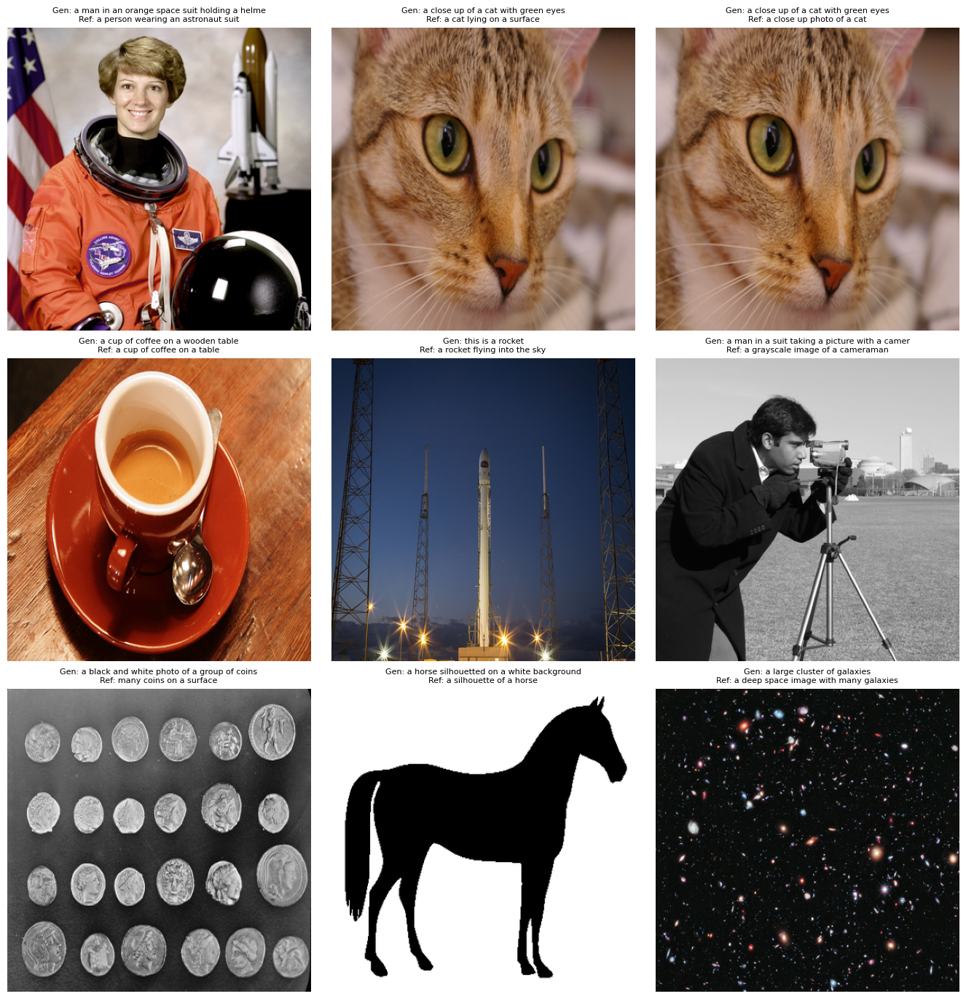

In [16]:
def show_caption_examples(df):
    cols = 3
    rows = math.ceil(len(df) / cols)

    plt.figure(figsize=(cols * 4.5, rows * 4.6))
    for i in range(len(df)):
        row = df.iloc[i]
        plt.subplot(rows, cols, i + 1)
        plt.imshow(Image.open(row["image"]).convert("RGB"))
        title = f'Gen: {row["generated_caption"][:45]}\nRef: {row["reference_caption"][:45]}'
        plt.title(title, fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_caption_examples(caption_df)


## 7. BLEU-4 и CIDEr-like


In [17]:
def simple_tokenize(text):
    return [tok.strip(".,!?;:()[]{}\"'").lower() for tok in str(text).split() if tok.strip()]


def compute_bleu4(generated, references):
    smoothie = SmoothingFunction().method1
    hyp_tokens = [simple_tokenize(s) for s in generated]
    ref_tokens = [[simple_tokenize(r) for r in refs] for refs in references]

    return corpus_bleu(
        ref_tokens,
        hyp_tokens,
        weights=(0.25, 0.25, 0.25, 0.25),
        smoothing_function=smoothie,
    )


def ngrams(tokens, n):
    return [" ".join(tokens[i:i+n]) for i in range(len(tokens) - n + 1)]


def compute_cider_like(generated, references, max_n=4):
    document_frequency = Counter()
    ref_ngrams_by_item = []

    for refs in references:
        item_ngrams = set()
        for ref in refs:
            tokens = simple_tokenize(ref)
            for n in range(1, max_n + 1):
                item_ngrams.update(ngrams(tokens, n))
        ref_ngrams_by_item.append(item_ngrams)
        for gram in item_ngrams:
            document_frequency[gram] += 1

    n_docs = len(references)
    scores = []

    for gen, ref_grams in zip(generated, ref_ngrams_by_item):
        gen_tokens = simple_tokenize(gen)
        gen_grams = []
        for n in range(1, max_n + 1):
            gen_grams.extend(ngrams(gen_tokens, n))

        if not gen_grams:
            scores.append(0.0)
            continue

        weighted_hits = 0.0
        weighted_total = 0.0

        for gram in gen_grams:
            idf = math.log((n_docs + 1) / (document_frequency.get(gram, 0) + 1)) + 1.0
            weighted_total += idf
            if gram in ref_grams:
                weighted_hits += idf

        scores.append(weighted_hits / weighted_total if weighted_total > 0 else 0.0)

    return float(np.mean(scores))


bleu4 = compute_bleu4(generated_captions, reference_captions)
cider_like = compute_cider_like(generated_captions, reference_captions)

metrics_df = pd.DataFrame({
    "Metric": ["BLEU-4", "CIDEr-like"],
    "Value": [bleu4, cider_like],
})

display(metrics_df)


,Metric,Value
0,BLEU-4,0.228103
1,CIDEr-like,0.241291


## 8. Стресс-тест


,difficulty,question,expected,predicted
0,counting,How many coins are in the image?,many / hard to count exactly,35
1,visual property,Is the image in color?,no,no
2,counting and domain,How many galaxies are in the image?,many / impossible to count exactly,many
3,ambiguous visual style,What color is the horse?,black silhouette / not a real color photo,black
4,causal inference,What happened before this image?,not directly observable,space shuttle


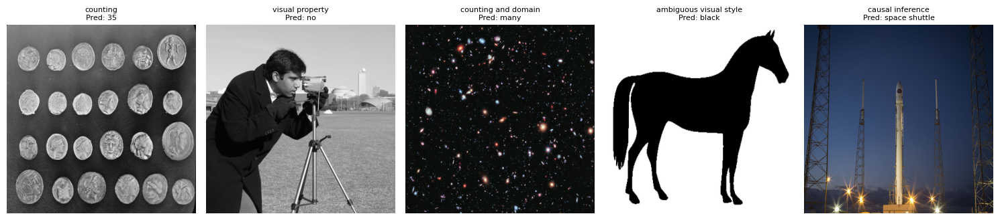

In [18]:
hard_cases = [
    {
        "image": str(IMAGE_DIR / "coins.png"),
        "question": "How many coins are in the image?",
        "expected": "many / hard to count exactly",
        "difficulty": "counting",
    },
    {
        "image": str(IMAGE_DIR / "camera.png"),
        "question": "Is the image in color?",
        "expected": "no",
        "difficulty": "visual property",
    },
    {
        "image": str(IMAGE_DIR / "hubble.png"),
        "question": "How many galaxies are in the image?",
        "expected": "many / impossible to count exactly",
        "difficulty": "counting and domain",
    },
    {
        "image": str(IMAGE_DIR / "horse.png"),
        "question": "What color is the horse?",
        "expected": "black silhouette / not a real color photo",
        "difficulty": "ambiguous visual style",
    },
    {
        "image": str(IMAGE_DIR / "rocket.png"),
        "question": "What happened before this image?",
        "expected": "not directly observable",
        "difficulty": "causal inference",
    },
]

hard_results = []

for case in hard_cases:
    pred = answer_question(case["image"], case["question"])
    hard_results.append({
        "difficulty": case["difficulty"],
        "question": case["question"],
        "expected": case["expected"],
        "predicted": pred,
        "image": case["image"],
    })

hard_df = pd.DataFrame(hard_results)
display(hard_df[["difficulty", "question", "expected", "predicted"]])

plt.figure(figsize=(15, 4))
for i, case in enumerate(hard_results):
    plt.subplot(1, 5, i + 1)
    plt.imshow(Image.open(case["image"]).convert("RGB"))
    plt.title(f'{case["difficulty"]}\nPred: {case["predicted"][:25]}', fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()


## 9. Occlusion sensitivity как приближённая оценка внимания


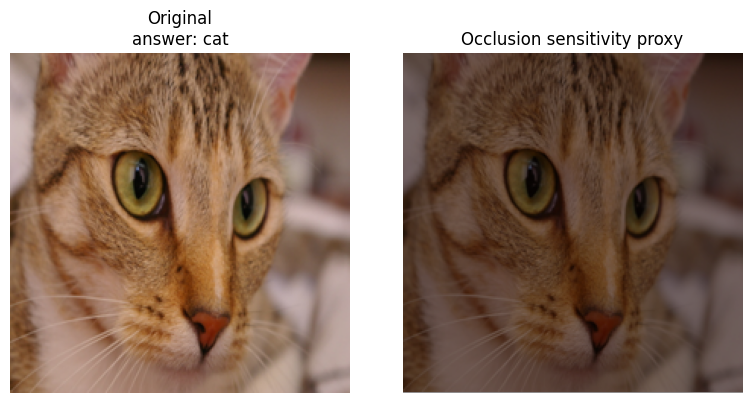

In [19]:
def visualize_occlusion_sensitivity(image_path, question, grid=4):
    image = Image.open(image_path).convert("RGB").resize((224, 224))
    base_answer = answer_question(image_path, question)

    w, h = image.size
    patch_w, patch_h = w // grid, h // grid
    changes = np.zeros((grid, grid), dtype=float)

    for gy in range(grid):
        for gx in range(grid):
            occluded = image.copy()
            x0, y0 = gx * patch_w, gy * patch_h
            patch = Image.new("RGB", (patch_w, patch_h), color=(128, 128, 128))
            occluded.paste(patch, (x0, y0))

            tmp_path = RESULTS_DIR / f"occlusion_{gy}_{gx}.png"
            occluded.save(tmp_path)

            answer = answer_question(str(tmp_path), question)
            changes[gy, gx] = 0.0 if answer.lower().strip() == base_answer.lower().strip() else 1.0

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original\nanswer: {base_answer}")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(changes, cmap="hot", alpha=0.45, extent=(0, w, h, 0))
    plt.title("Occlusion sensitivity приближение")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return changes, base_answer


_ = visualize_occlusion_sensitivity(str(IMAGE_DIR / "cat.png"), "What animal is in the image?", grid=4)


## 10. CLIP context/смещение test


In [20]:
def zero_shot_classify(image_path, class_labels):
    image = Image.open(image_path).convert("RGB")
    image_inputs = clip_processor(images=image, return_tensors="pt").to(DEVICE)
    text_prompts = [f"a photo of {label}" for label in class_labels]
    text_inputs = clip_processor(text=text_prompts, return_tensors="pt", padding=True, truncation=True).to(DEVICE)

    with torch.no_grad():
        image_features = clip_model.get_image_features(**image_inputs)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)

        text_features = clip_model.get_text_features(**text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    logits = (image_features @ text_features.T) * 100
    probs = logits.softmax(dim=-1).squeeze().cpu().numpy()

    return dict(zip(class_labels, probs))


context_tests = [
    ("cat vs dog", str(IMAGE_DIR / "cat.png"), ["a cat", "a dog", "a horse"]),
    ("rocket vs airplane", str(IMAGE_DIR / "rocket.png"), ["a rocket", "an airplane", "a car"]),
    ("coffee vs food", str(IMAGE_DIR / "coffee.png"), ["coffee", "food", "a coin"]),
    ("space context", str(IMAGE_DIR / "hubble.png"), ["space", "a city", "food"]),
]

records = []
for name, path, classes in context_tests:
    probs = zero_shot_classify(path, classes)
    pred = max(probs, key=probs.get)
    records.append({
        "test": name,
        "prediction": pred,
        **{f"p_{k}": float(v) for k, v in probs.items()},
    })

display(pd.DataFrame(records))


,test,prediction,p_a cat,p_a dog,p_a horse,p_a rocket,p_an airplane,p_a car,p_coffee,p_food,p_a coin,p_space,p_a city
0,cat vs dog,a cat,0.995543,0.00379,0.000667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,rocket vs airplane,a rocket,NaN,NaN,NaN,0.999628,0.000121,0.000251,NaN,NaN,NaN,NaN,NaN
2,coffee vs food,coffee,NaN,NaN,NaN,NaN,NaN,NaN,0.999344,0.000533,0.000123,NaN,NaN
3,space context,space,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000233,NaN,0.999564,0.000203


## 11. Ответы для отчёта

**1. Что показывает t-SNE CLIP-пространства?**  
t-SNE показывает, что CLIP располагает изображения в пространстве по семантической близости. Космические изображения и объекты, связанные с техникой, оказываются ближе друг к другу, а животные и бытовые объекты занимают другие области.

**2. Для каких типов вопросов BLIP ошибается чаще всего?**  
BLIP чаще ошибается на вопросах о точном счёте, причинно-следственных предположениях, неоднозначных визуальных стилях и вопросах, где ответ не содержится явно в изображении.

**3. Почему CIDEr считается более надёжной метрикой, чем BLEU?**  
BLEU оценивает буквальное n-граммное совпадение и плохо учитывает переформулировки. CIDEr-подход учитывает информативность n-грамм и лучше работает при нескольких человеческих описаниях.

**4. Объясняет ли occlusion sensitivity ошибку модели?**  
Occlusion sensitivity показывает, какие области изображения влияют на ответ. Это не полноценная attention-карта, но полезная диагностическая эвристика: если закрытие области меняет ответ, значит модель была чувствительна к этой части изображения.

**5. Какой смещение обнаружен в CLIP?**  
CLIP склонен использовать контекстные корреляции: фон, тип сцены и часто встречающиеся сочетания объектов. Это может давать ошибки при переносе модели на изображения из другого домена.

**6. Почему CLIP обобщается лучше обычных классификационных моделей?**  
CLIP обучается на парах изображение-текст и связывает визуальные признаки с естественным языком. Поэтому он способен выполнять zero-shot retrieval и классификацию без дообучения под фиксированный список классов.
